# <center>  Описание проекта:</center>

Нас попросили подготовить анализ рынка заведений общественного питания Москвы на основе доступных данных для выявления ключевых особенностей, актуальных трендов и предпочтений потребителей. Результаты исследования помогут инвесторам фонда «Shut Up and Take My Money» выбрать оптимальный формат заведения, его расположение, ценовую политику и концепцию меню.

# <center>  Описание данных:</center>

 **Столбцы:**
- **name** — название заведения.
- **address** — адрес заведения.
- **category** — категория заведения (например, «кафе», «пиццерия», «кофейня»).
- **hours** — информация о днях и часах работы.
- **lat** — широта географической точки, в которой находится заведение.
- **lng** — долгота географической точки, в которой находится заведение.
- **rating** — рейтинг заведения по оценкам пользователей в Яндекс Картах (максимальная оценка — 5.0).
- **price** — категория цен в заведении (например, «средние», «ниже среднего», «выше среднего»).
- **avg_bill** — строка, содержащая среднюю стоимость заказа в виде диапазона. Примеры:
  - «Средний счёт: 1000–1500 ₽»
  - «Цена чашки капучино: 130–220 ₽»
  - «Цена бокала пива: 400–600 ₽»
- **middle_avg_bill** — числовое значение среднего чека:
  - Если указан диапазон, в столбец записывается медиана значений.
  - Если указано одно число, записывается это число.
  - Если значение отсутствует или не начинается с подстроки «Средний счёт», то столбец остаётся пустым.
- **middle_coffee_cup** — числовое значение стоимости чашки капучино:
  - Если указан диапазон, в столбец записывается медиана значений.
  - Если указано одно число, записывается это число.
  - Если значение отсутствует или не начинается с подстроки «Цена чашки капучино», то столбец остаётся пустым.
- **chain** — признак сетевого заведения:
  - `0` — заведение не является сетевым.
  - `1` — заведение является сетевым.
- **district** — административный район, в котором находится заведение (например, Центральный административный округ).
- **seats** — количество посадочных мест.



# <center>План работы</center>

- **1.** Загрузка данных и изучение общей информации
  - **1.1** Посмотрим, сколько заведений представлено.

- **2.** Выполним предобработку данных:
  - **2.1** Создадим столбец `street` с названиями улиц из столбца с адресом.
    - **2.2** Создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

- **3** Анализ данных
  - **3.1** Ответим на вопрос: "Какие категории заведений представлены в данных?"
    - **3.1.1** Исследуем количество заведений общественного питания по категориям. Построим визуализации.
  - **3.2** Исследуем количество посадочных мест в местах по категориям.
  - **3.3** Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
  - **3.4** Какие категории заведений чаще являются сетевыми?
  - **3.5** Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве.
    - **3.5.1** Построим подходящую для такой информации визуализацию.
  - **3.6** Уточним, какие административные районы Москвы есть в датасете.
    - **3.6.1** Отобразим общее количество заведений и количество заведений каждой категории по районам.
  - **3.7** Визуализируем распределение средних рейтингов по категориям заведений.
  - **3.8** Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
  - **3.9** Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`.
  - **3.10** Найдем топ-15 улиц по количеству заведений.
  - **3.11** Построим график распределения количества заведений и их категорий по этим улицам.
  - **3.12** Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
  - **3.13** Проанализируем цены в Центральном административном округе и других. Ответим на вопрос, как удалённость от центра влияет на цены в заведениях.

- **4.** Детализируем исследование: открытие кофейни
  - **4.1** Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
  - **4.2** Есть ли круглосуточные кофейни?
  - **4.3** Какие у кофеен рейтинги? Как они распределяются по районам?
  - **4.4** На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

- **5** Вывод
- **6** Рекомендации
- **7** Презентация

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import median
from plotly import graph_objects as go
import plotly.express as px 
from folium import Map, Marker
from folium.plugins import MarkerCluster
import numpy as np
import json
from folium import Map, Choropleth

### Загрузим данные и изучим общую информацию

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Данные состоят из 8406 строк и 14 столбцов. На первый взгляд типы данных определенны корректно.

In [5]:
#приведем столбцы name, category, address к нижнему регистру
data[['name', 'category', 'address']] = data[['name', 'category', 'address']].apply(lambda x: x.str.lower())

In [6]:
#проверим наличие явных дубликатов
data.duplicated().sum()

0

In [7]:
#проверим наличие неявных дубликатов по столбцам name, category, address
data[data[['name', 'category', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


In [8]:
# Мы видим, что есть два неявных дубликата, однако у кафе "кафе" разные широва и долгота, поэтому будем считать это разными
# заведениями с одинаковым наиманованием.
# Рестона "more poke" задублирован. Удалим одну строчку датафрейма, добавив в subset столец с долготой и широтой.
data = data.drop_duplicates(subset=['name', 'category', 'address', 'lat', 'lng']).reset_index(drop=True)
# смотрим, что получилось
data[data[['name', 'category', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN


#### Посмотрим, сколько заведений представлено:

In [9]:
# Каждая строчка датафрейма - это одтельно взятое заведение. Поэтому для подсчета заведений мы посчитаем количество строк.
print('Количетсво заведений, предствленных в данных:', len(data['name']))

Количетсво заведений, предствленных в данных: 8405


In [10]:
#посмотрим пропуски
data.isna().mean()*100

name                  0.000000
category              0.000000
address               0.000000
district              0.000000
hours                 6.377156
lat                   0.000000
lng                   0.000000
rating                0.000000
price                60.559191
avg_bill             54.598453
middle_avg_bill      62.534206
middle_coffee_cup    93.634741
chain                 0.000000
seats                42.962522
dtype: float64

Столбцы **price**, **avg_bill**, **middle_avg_bill**, **middle_coffee_cup**, **seats** содержать пропуски более 40% и больше.
Заполнение данных пропусков приведет к значительному искажению результатов исследования. Поэтому пропуски мы трогать не будем.

### Выполним предобработку данных:

#### Создадим столбец street с названиями улиц из столбца с адресом.

In [11]:
data['street'] = data['address'].str.extract('москва, (?P<street>\D+)')

In [12]:
#посмотрим, что получилось
data.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
8400,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,"профсоюзная улица,"
8401,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,"пролетарский проспект,"
8402,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,"люблинская улица,"
8403,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,"люблинская улица,"
8404,kebab time,кафе,"москва, россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,"россошанский проезд,"


#### Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [13]:
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно' 

In [14]:
data.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
8400,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,"профсоюзная улица,",False
8401,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,"пролетарский проспект,",False
8402,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,"люблинская улица,",True
8403,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,"люблинская улица,",True
8404,kebab time,кафе,"москва, россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,"россошанский проезд,",True


### Анализ данных

#### Ответим на вопрос: "Какие категории заведений представлены в данных?"

In [15]:
#посмотрим какие категории заведений мы имеем.
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

##### Исследуем количество объектов общественного питания по категориям.  Построим визуалицазии. 

In [16]:
category_count = data.groupby('category', as_index=False)\
    .agg(count=('name','count'))\
    .sort_values(by='count', ascending=False)\
    

category_count['ratio'] = ((category_count['count']/category_count['count'].sum())*100).round(2)
category_count

,category,count,ratio
3,кафе,2378,28.29
6,ресторан,2042,24.30
4,кофейня,1413,16.81
0,"бар,паб",765,9.10
5,пиццерия,633,7.53
2,быстрое питание,603,7.17
7,столовая,315,3.75
1,булочная,256,3.05


In [17]:
# Выберем стиль для всех графиков
plt.style.use('seaborn')

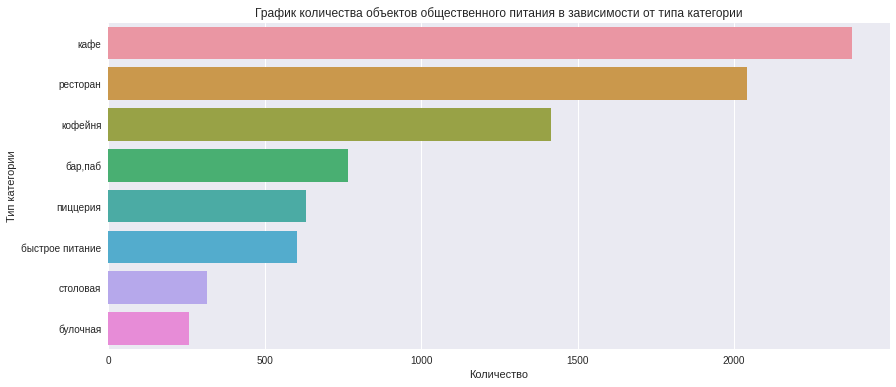

In [18]:
plt.figure(figsize=(14, 6))

sns.barplot(x='count', y='category', data=category_count)
plt.title('График количества объектов общественного питания в зависимости от типа категории')
plt.xlabel('Количество')
plt.ylabel('Тип категории')
plt.show()

На графике видно, что лидерство по количеству объектов занимает **Кафе** и **Рестораны** с **2378*, **2042** объектами соответсвенно. И  суммарной долей **50%** от общего числа заведений в Москве.

Третье место занимают **Кофейни** с долей рынка **16%**.

По середине находятся **Бар/пабы**, **Пиццерии**, **Быстрое питание**.

Замыкают список **Столовые** и **Булочные**.

#### Исследуем количество посадочных мест в местах по категориям.

In [19]:
ordered_categories = data\
    .groupby('category')\
    .agg(median=('seats', 'median'))\
    .sort_values(by='median',ascending=False)\
    .reset_index()
ordered_categories 

,category,median
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


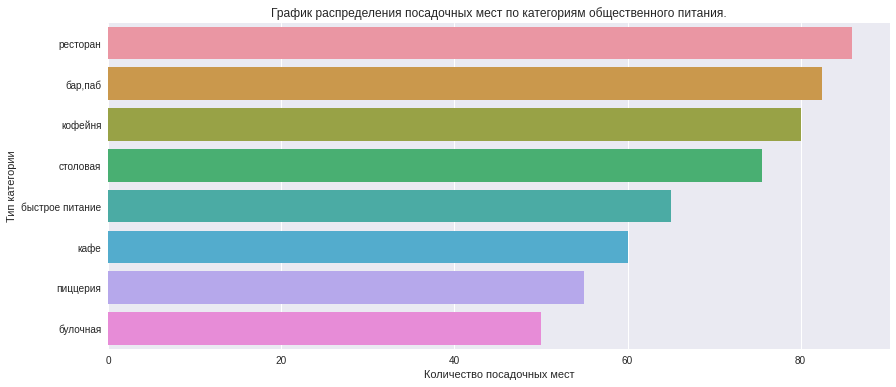

In [20]:
plt.figure(figsize=(14, 6))

sns.barplot(x='median', y='category', data=ordered_categories) 
plt.title('График распределения посадочных мест по категориям общественного питания.')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Тип категории')
plt.show()

Лидеры по посадочным местам являются рестораны, бары/пабы и кофейни.

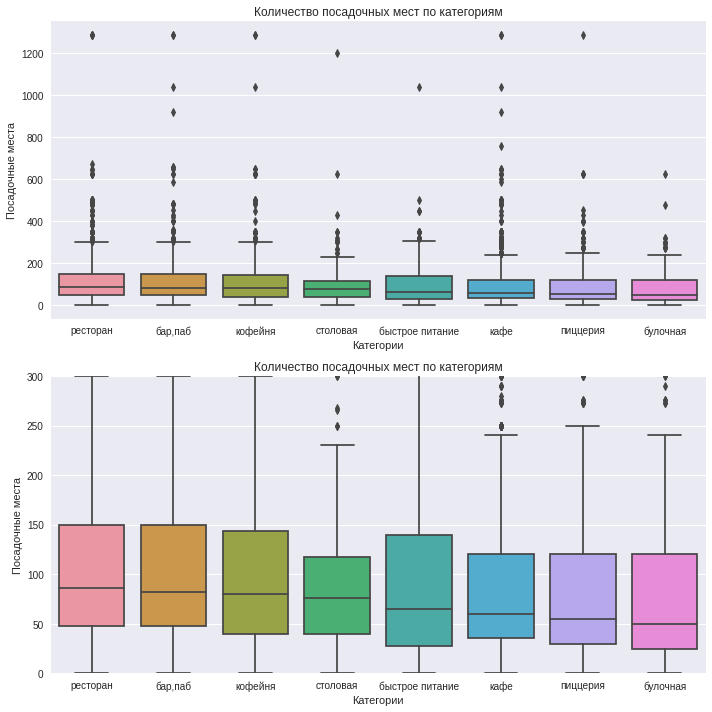

In [21]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 1, 1)
sns.boxplot(x='category', y='seats', data=data, order=ordered_categories['category'])
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Посадочные места')

plt.subplot(2, 1, 2)
sns.boxplot(x='category', y='seats', data=data, order=ordered_categories['category'])
plt.ylim(0, 300)
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Посадочные места')

plt.tight_layout()
plt.show()

Во всех категориях есть как небольшие, так и большие заведения, распределение основных значений (перцентилей) довольно компактно — чаще всего от нескольких десятков до сотни мест.

#### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [22]:
chain = data.groupby('chain', as_index=False)\
    .agg(count=('name', 'count'))\
    

fig = go.Figure(data=[go.Pie(labels=chain['chain'].map({0: 'Не сетевое заведение', 1: 'Сетевое заведение'}),\
                             values=chain['count'])])
fig.update_layout(title='Распределение заведений по сетевому признаку')
fig.show()

Не сетевые заведения занимают больше половы доли **(61,9%)** от рынка общественного питания города Москвы.

#### Какие категории заведений чаще являются сетевыми?

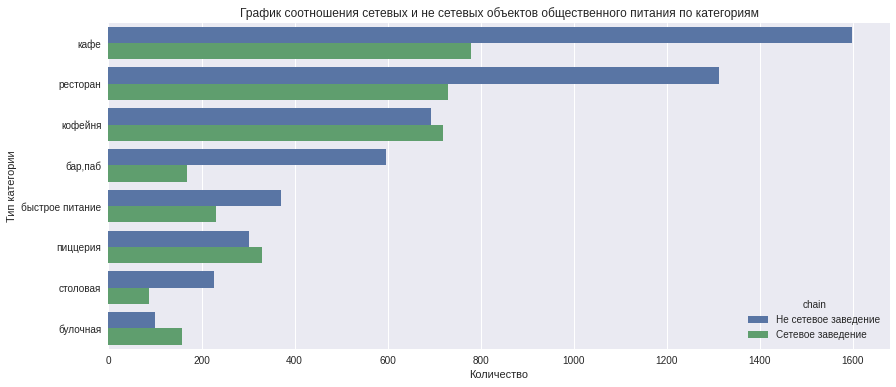

In [23]:
plt.figure(figsize=(14, 6))

category_count_chain = data.groupby(['category', 'chain'], as_index=False)\
    .agg(count=('name','count'))\
    .sort_values(by='count', ascending=False)\
    

category_count_chain['chain'] = category_count_chain['chain'].map({0: 'Не сетевое заведение', 1: 'Сетевое заведение'})

sns.barplot(x='count', y='category', data=category_count_chain, hue='chain')
plt.title('График соотношения сетевых и не сетевых объектов общественного питания по категориям')
plt.xlabel('Количество')
plt.ylabel('Тип категории')
plt.show()

В **Кафе**, **Ресторанах**, **Барах/пабах**,  **Столовых**  и **Быстрое питания** доминируют не сетевые объекты.
В **Кофейнях** и **Пицериях** соотношения примерно равны.
В категории **Булоная** перевес за сетевыми заведениями.

#### Сгрупируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. 

In [24]:
top_chain = data\
    .query('chain == 1')\
    .groupby(['name', 'category']).agg(count=('name', 'count'))\
    .sort_values(by='count', ascending=False)\
    .reset_index()\
    .head(15)\
    

top_chain

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


##### Построим подходящую для такой информации визуализацию. 

In [25]:
fig = px.bar(
    top_chain,
    x='count',
    y='name',
    color='category',
    title='График количества объектов питания по наименованию сети',
    width=1000,    
    height=500    
)


fig.update_layout(
    xaxis_title="Количество объектов",
    yaxis_title="Наименование сети"
    )
fig.show()

Кофейни занимают лидирующие позиции по количеству объектов, что указывает на высокий спрос на этот формат заведений. Среди них сеть **Шоколадниц** занимает первое место с **119** точками. Также популярны пиццерии **Домино’с Пицца**, **Додо Пицца** и рестораны **Яндекс Лавка**, **Prime**. Менее распространены булочные и небольшие кафе.

#### Уточним какие административные районы Москвы есть в датасете.

In [26]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

##### Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [27]:
district_grouped = data\
    .groupby(['district', 'category']).agg(count=('name','count')).reset_index().sort_values(by='count', ascending=False)
    
district_pivot = district_grouped.pivot(
    index='district',     
    columns='category',   
    values='count'        
)

district_pivot['total'] = district_pivot.sum(axis=1)
district_pivot.sort_values(by='total', ascending=False)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Северный административный округ,68,39,58,235,193,77,188,41,899
Южный административный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Западный административный округ,50,37,62,239,150,71,218,24,851
Восточный административный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


In [28]:
fig = px.bar(
    district_grouped, 
    x='district', 
    y='count', 
    color='category',
    title="Количество объектов питания по категориям",
    barmode='stack',
    width=1000,    
    height=800  
)

fig.update_layout(
    xaxis_title="административный округ",
    yaxis_title="Количество"
    )

fig.show()

- Центральный административный округ выделяется на фоне остальных районов: в нем находится наибольшее количество заведений всех категорий.
- Кафе и рестораны — это наиболее распространённые категории заведений в большинстве районов.
- Буфеты, булочные и столовые составляют меньшую долю заведений во всех районах.

#### Визализируем распределение средних рейтингов по категориям заведений.

In [29]:
rating = data\
    .groupby('category', as_index=False)\
    .agg({'rating': 'median'})\
    .sort_values(by='rating', ascending=False)

rating

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


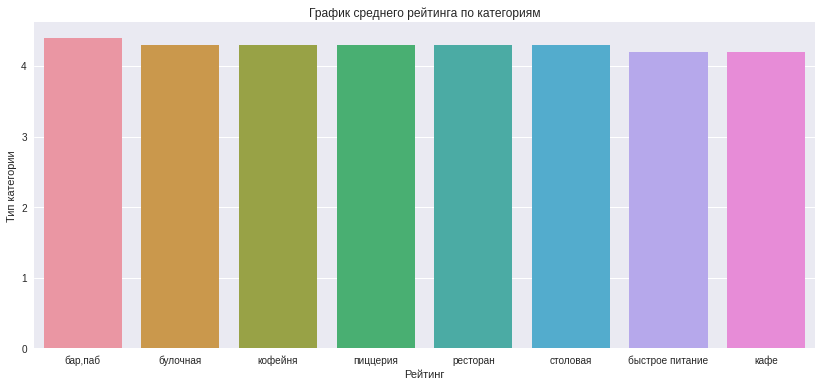

In [30]:
plt.figure(figsize=(14, 6))

sns.barplot(x='category', y='rating', data=rating)
plt.title('График среднего рейтинга по категориям')
plt.xlabel('Рейтинг')
plt.ylabel('Тип категории')
plt.show()

Средний рейтинг по всем категориям объектов общественного питания находся примерно на одном уровне (от **4.2** до **4.4** баллов)

#### Построем фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

In [31]:
district_rating = data.groupby('district', as_index=False)\
    .agg({'rating':'median'})
    
district_rating    

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [32]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

#### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [33]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m1)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m1

#### Найдем топ-15 улиц по количеству заведений

In [34]:
top_15_streets = data\
    .groupby('street')\
    .agg(count=('name','count'))\
    .sort_values(by='count', ascending=False)\
    .reset_index()\
    .head(15)

top_15_streets

,street,count
0,"проспект мира,",184
1,"профсоюзная улица,",120
2,"проспект вернадского,",107
3,"ленинский проспект,",107
4,"ленинградский проспект,",95
5,"дмитровское шоссе,",87
6,"каширское шоссе,",76
7,"варшавское шоссе,",70
8,"ленинградское шоссе,",68
9,"мкад,",65


#### Построим график распределения количества заведений и их категорий по этим улицам. 

In [72]:
top_15_streets_category = data.query('street in @top_15_streets["street"]')\
    .groupby(['street','category'])\
    .agg(count=('name','count'))\
    .reset_index()\
    .sort_values(by='count', ascending=False)\
    
    
#     .pivot(
#     index='street',     
#     columns='category',   
#     values='count'   
#     )\
#     .fillna(0)

#top_15_streets_category['total'] = top_15_streets_category.sum(axis=1)
#top_15_streets_category = top_15_streets_category.sort_values(by='total', ascending=False)
top_15_streets_category


,street,category,count
78,"проспект мира,",кафе,53
63,"мкад,",кафе,45
81,"проспект мира,",ресторан,45
79,"проспект мира,",кофейня,36
73,"проспект вернадского,",ресторан,33
...,...,...,...
23,"кутузовский проспект,",булочная,1
68,"проспект вернадского,",булочная,1
66,"мкад,",столовая,1
58,"люблинская улица,",пиццерия,1


In [73]:
fig = px.bar(
    top_15_streets_category, 
    x='count', 
    y='street', 
    color='category',
    title="График распределения количества заведений и их категорий по этим улицам",
    barmode='stack',
    width=1000,    
    height=800  
)

fig.update_layout(
    xaxis_title="Количество объектов",
    yaxis_title="Адрес"
    )

fig.show()

- Наиболее популярные улицы по количеству заведений: **Проспект Мира**, **Ленинский проспект**, **Люблинская улица**.
- Наибольшая категория заведений на большинстве улиц — это **кафе** и **рестораны**.

#### Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [74]:
result = data\
    .groupby('street')\
    .agg(count=('name','count'))\
    .sort_values(by='count', ascending=False)\
    .reset_index()
  
streets_one_place = result.query('count == 1')

In [94]:
data.query('street in @streets_one_place["street"]')\
    .groupby('district').agg(count=('street', 'count'))\
    .reset_index()\
    .sort_values(by='count', ascending=False)
    

,district,count
5,Центральный административный округ,137
3,Северо-Восточный административный округ,62
1,Западный административный округ,49
0,Восточный административный округ,47
8,Южный административный округ,43
2,Северный административный округ,42
6,Юго-Восточный административный округ,40
4,Северо-Западный административный округ,22
7,Юго-Западный административный округ,21


In [97]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m8 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data.query('street in @streets_one_place["street"]')\
    .groupby('district').agg(count=('street', 'count'))\
    .reset_index()\
    .sort_values(by='count', ascending=False),
    columns=['district', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество улиц, на которых находится только один объект общепита',
).add_to(m8)

# выводим карту
m8

Центральный округ доминирует по количеству улиц с единственным заведением, что говорит о высоком разнообразии улиц, но меньшем скоплении заведений на каждой из них. На периферии такие улицы встречаются реже, что может быть связано с меньшей плотностью населения и объектов инфраструктуры.

####  Проанализируем цены в центральном административном округе и других. Ответим на вопрос как удалённость от центра влияет на цены в заведениях?

In [38]:
middle_avg_bill_district = data.groupby('district').agg(median=('middle_avg_bill', 'median')).reset_index()
middle_avg_bill_district

,district,median
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [39]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_district,
    columns=['district', 'median'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2

### Детализируем исследование: открытие кофейни

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [40]:
# отфильтруем датасет по категории объектов общественного питания "кофейня"
cofe_df = data[data['category'] == 'кофейня']

In [41]:
cofe_df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,"улица маршала федоренко,",False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,"коровинское шоссе,",False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,"улица маршала федоренко,",False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,"улица дыбенко,",False


In [42]:
print('Кофеен в датасете:', len(cofe_df))
print(f'Доля кофеен на рынке общепита Москвы: {len(cofe_df)/len(data):.2%}')

Кофеен в датасете: 1413
Доля кофеен на рынке общепита Москвы: 16.81%


In [43]:
cofe_group = cofe_df.groupby('district')\
    .agg(count=('name', 'count'))\
    .sort_values(by='count', ascending=False)\
    .reset_index()

cofe_group['ratio'] = ((cofe_group['count']/cofe_group['count'].sum())*100).round(2)
cofe_group

,district,count,ratio
0,Центральный административный округ,428,30.29
1,Северный административный округ,193,13.66
2,Северо-Восточный административный округ,159,11.25
3,Западный административный округ,150,10.62
4,Южный административный округ,131,9.27
5,Восточный административный округ,105,7.43
6,Юго-Западный административный округ,96,6.79
7,Юго-Восточный административный округ,89,6.30
8,Северо-Западный административный округ,62,4.39


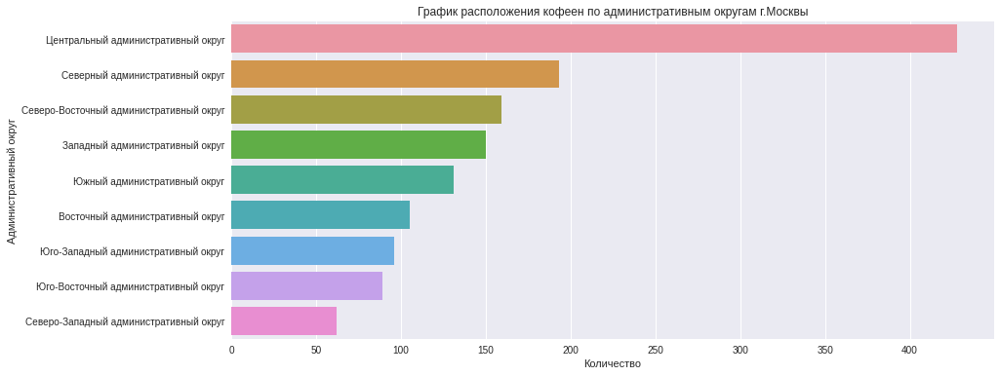

In [44]:
plt.figure(figsize=(14, 6))

sns.barplot(x='count', y='district', data=cofe_group)
plt.title('График расположения кофеен по административным округам г.Москвы')
plt.xlabel('Количество')
plt.ylabel('Административный округ')
plt.show()

Больше всего кофеен находится в Центральном административном окгурге **428** объектов, что составляет **30%** от всего количества кофеен в Москве.
На втором месте Северный административный округ с **193** объектами и долей **13%**
Третье место делят Северо-Восточный и Западный административные округа с **159** и **150** объектами, соотвественно, и долями **11%** и **10%**.

#### Есть ли круглосуточные кофейни?

In [45]:
print('Количество круглосуточных кофеен в Москве:' , cofe_df['is_24_7'].sum())

Количество круглосуточных кофеен в Москве: 59


In [46]:
cofe_24_7 = cofe_df.groupby('is_24_7').agg(count=('is_24_7','count')).reset_index()
cofe_24_7    


fig = go.Figure(data=[go.Pie(labels=cofe_24_7['is_24_7'].map({False: 'Не круглосуточное', True: 'Круглосуточное'}),
                             values=cofe_24_7['count'])]) 
fig.update_layout(title='Распределение круглосуточных и некруглосуточных кафе')
fig.show()

In [47]:
cofe_df\
    .query('is_24_7 == True')\
    .groupby('district')\
    .agg(count=('name', 'count'))\
    .sort_values(by='count', ascending=False)\
    .reset_index()

,district,count
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


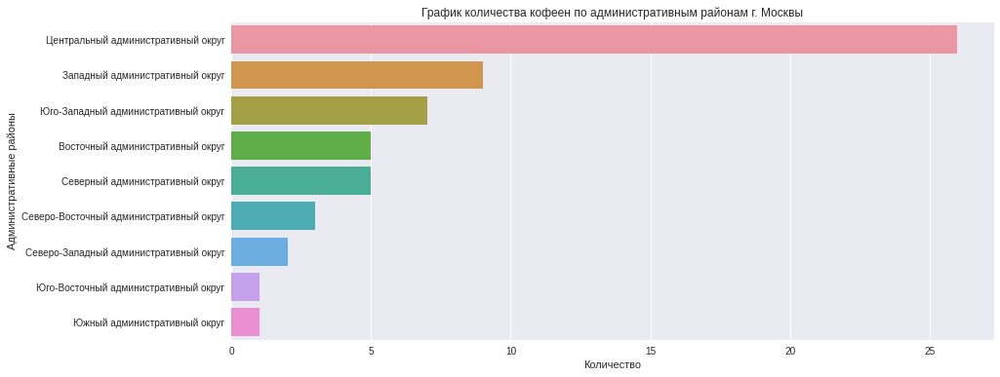

In [48]:
plt.figure(figsize=(14, 6))

sns.barplot(x='count', y='district', data=cofe_df\
    .query('is_24_7 == True')\
    .groupby('district')\
    .agg(count=('name', 'count'))\
    .sort_values(by='count', ascending=False)\
    .reset_index())
plt.title('График количества кофеен по административным районам г. Москвы')
plt.xlabel('Количество')
plt.ylabel('Административные районы')
plt.show()

Больше всего круглосуточных кофеен в Центральном административном округе.

In [49]:
cofe_df.query('is_24_7 == True').groupby('district').agg(median=('rating', 'mean')).reset_index()

,district,median
0,Восточный административный округ,4.300000
1,Западный административный округ,4.200000
2,Северный административный округ,4.220000
3,Северо-Восточный административный округ,3.866667
4,Северо-Западный административный округ,4.250000
5,Центральный административный округ,4.288462
6,Юго-Восточный административный округ,2.300000
7,Юго-Западный административный округ,4.271429
8,Южный административный округ,4.000000


In [50]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=cofe_df.query('is_24_7 == True').groupby('district').agg(median=('rating', 'mean')).reset_index(),
    columns=['district', 'median'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен 24/7 по административным районам г. Москвы',
).add_to(m5)

# выводим карту
m5

В основном рейтинг круглосуточных кафе в г.Москве составляет 4.3 балла. Однако, в Юго-Восточный административном округе единственное круглосуточное кафе имеет рейтинг 2.3 балла.

In [51]:
cofe_df.query('is_24_7 == True').groupby('district').agg(median=('middle_coffee_cup', 'median')).reset_index().fillna(0)

,district,median
0,Восточный административный округ,110.0
1,Западный административный округ,275.0
2,Северный административный округ,285.0
3,Северо-Восточный административный округ,170.0
4,Северо-Западный административный округ,0.0
5,Центральный административный округ,256.0
6,Юго-Восточный административный округ,0.0
7,Юго-Западный административный округ,256.0
8,Южный административный округ,0.0


#### Какие у кофеен рейтинги? Как они распределяются по районам?

In [52]:
rating_cofe = cofe_df.groupby('district', as_index=False)['rating'].agg('median').round(2).sort_values('rating', ascending=False)
rating_cofe

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


In [53]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=rating_cofe,
    columns=['district', 'rating'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по административным районам г. Москвы',
).add_to(m6)

# выводим карту
m6

Средний рейтинг кофеен города Москва составляет 4.3 балла. Самый низкий рейтинг у кофеен Западного административного округа 4.2 балла.

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [54]:
cofe_df['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [55]:
# посмотрим среднюю цену чашки капучино по округам
cappuccino_middle_price = cofe_df\
    .groupby('district')\
    .agg({'middle_coffee_cup':'median'})\
    .sort_values(by='middle_coffee_cup', ascending=False)\
    .reset_index()
cappuccino_middle_price

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [56]:
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=cappuccino_middle_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек капучино по административным районам г. Москвы',
).add_to(m4)

# выводим карту
m4

### Вывод

На основании приведенных данных можно сделать следующие выводы:

Общая характеристика рынка общественного питания:

В Москве функционируют 8405 точек общественного питания.
Кафе и рестораны занимают 50% рынка, а оставшаяся половина распределена между кофейнями, барами/пабами, пиццериями, столовыми, булочными и заведениями быстрого питания.
Большинство заведений не сетевые (61.9%), однако у кофеен доля сетевых и не сетевых заведений почти равна.
Посадочные места:

Среднее количество посадочных мест в заведениях варьируется от 50 до 80 в зависимости от категории.
Лидерами по количеству посадочных мест являются рестораны, бары/пабы и кофейни.
Кофейни на рынке:

Кофейни занимают 16% доли рынка общественного питания.
Основная доля кофеен расположена в Центральном административном округе (30.29%), а также в Северном (13.66%), Северо-Восточном (11.25%) и Западном (10.62%) округах.
Качество и цены:

Средний рейтинг всех заведений общественного питания и отдельно кофеен составляет 4.3 балла, что говорит о высокой оценке со стороны посетителей.
Стоимость чашки капучино варьируется от 135 до 198 рублей.
Общий вывод: рынок общественного питания Москвы характеризуется разнообразием форматов и высокой оценкой со стороны потребителей. Кафе и рестораны занимают доминирующую долю рынка, но кофейни играют заметную роль, особенно в центральных районах. Средний рейтинг и разнообразие цен делают заведения доступными для широкой аудитории.

### Рекомендации

Рекомендации:

Для эффективного развития сети кофеен рекомендуется начать с Центрального административного округа (ЦАО), а также развивать точки в Западном (ЗАО) и Юго-Западном (ЮЗАО) округах. Эти районы характеризуются платежеспособной аудиторией и высоким спросом на кофейни.
Ценообразование:

Установить цену на чашку капучино в пределах 170 рублей. Такая стоимость будет ниже, чем у прямых конкурентов, но достаточно высокой, чтобы сохранить доверие и лояльность платежеспособной аудитории.
График работы:

В ЦАО рекомендуется гибридный график работы:
Летний период: круглосуточный режим для привлечения отдыхающих, которые остаются в центре города даже ночью.
Зимний период: переход на режим работы с 9:00 до 23:00, учитывая снижение потока посетителей в ночное время.

Таким образом, стратегия сочетания умеренных цен, гибкого подхода к режиму работы и ориентации на ключевые районы позволит эффективно развивать сеть кофеен и успешно конкурировать на рынке общественного питания Москвы.

### Презентация

Презентация: <https://disk.yandex.ru/i/j9eQQqzBelF8Ew>